In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import arviz as az

import sys, importlib
from FetchModel import FetchModel
from PostPred import PostPred
importlib.reload(sys.modules['FetchModel'])
importlib.reload(sys.modules['PostPred'])
from FetchModel import FetchModel
from PostPred import PostPred

# 180

In [2]:
Y = pd.read_csv("../Datasets/Dataset_180.csv")
Y['Count_180'] = pd.to_numeric(Y['Count_180']).astype('Int64')
X = pd.read_csv("../Datasets/variables_to_select.csv")

In [3]:
idx_obs = Y[Y['Count_180'].notna()].index
idx_miss = Y[Y['Count_180'].isna()].index

# take XX% of the remaining indexes for a test set
XX = 0.3 # [0, 1] change this value to change the size of the test set
idx_test = sorted(np.random.choice(idx_obs.values, int(XX*len(idx_obs)), replace=False))
idx_miss = sorted(np.concatenate((idx_test, idx_miss.values)))
idx_obs = sorted(np.setdiff1d(idx_obs, idx_test))

Y_obs = Y.loc[idx_obs, :].reset_index(drop=True)
Y_miss = Y.loc[idx_miss, :].reset_index(drop=True)

X_obs = X.loc[idx_obs, :].reset_index(drop=True)
X_miss = X.loc[idx_miss, :].reset_index(drop=True)

In [4]:
stations = Y['idSensore']
years = pd.Series(Y['Year'] - 2009)
months = pd.Series(Y['Month'] - 3)
unique_values = sorted(set(stations))
mapping_dict = {value: index + 1 for index, value in enumerate(unique_values)}
transformed_stations = [mapping_dict[value] for value in stations]
stations_original = pd.Series(stations)
stations = pd.Series(transformed_stations)

stations_obs = stations.loc[idx_obs].reset_index(drop=True)
stations_miss = stations.loc[idx_miss].reset_index(drop=True)
years_obs = years.loc[idx_obs].reset_index(drop=True)
years_miss = years.loc[idx_miss].reset_index(drop=True)
months_obs = months.loc[idx_obs].reset_index(drop=True)
months_miss = months.loc[idx_miss].reset_index(drop=True)


day_in_month = [31,28,31,30,31,30,31,31,30,31,30,31]

max_month = [day_in_month[Y['Month'][i]-1] for i in range(0,Y.shape[0]) ]

max_month = pd.Series(max_month)
max_month_obs = max_month.loc[idx_obs].reset_index(drop=True)
max_month_miss = max_month.loc[idx_miss].reset_index(drop=True)

In [5]:
phi = 63
distances = pd.read_csv("../Datasets/distances.csv", index_col=0)

In [6]:
data_180 = {
    "N": len(Y_obs),
    "N_miss": len(Y_miss),

    "y": Y_obs['Count_180'],
    "P": X_obs.shape[1],

    "nyears": 13,
    "nstations": 45,
    "nmonths": 7,

    "station": stations_obs,
    "year": years_obs,
    "max_month": max_month_obs,
    "station_miss": stations_miss,
    "year_miss": years_miss,
    "max_month_miss": max_month_miss,

    "X": X_obs,
    "X_miss": X_miss,

    "phi": phi,
    "distances": distances,

    "month": months_obs,
    "month_miss": months_miss
}

In [7]:
Models_180_df = pd.DataFrame(columns = ['WAIC', 'LOO', 'MSE', 'MAE', 'MAD', 'inside CI', 'MSE test', 'MAE test', 'MAD test', 'inside CI test'])

In [8]:
bin_logit = FetchModel('bin_logit').compile()

19:22:46 - cmdstanpy - INFO - compiling stan file C:\Users\leoma\OneDrive\DOCUME~1\PoliMi\AAB4F7~1.23-\BAYESI~1\BAYESI~1\main\Modello\stan\bin_logit.stan to exe file C:\Users\leoma\OneDrive\Documents\PoliMi\A.A. 23-24\Bayesian statistics\Bayesian_Project\main\Modello\stan\bin_logit.exe
19:23:38 - cmdstanpy - INFO - compiled model executable: C:\Users\leoma\OneDrive\Documents\PoliMi\A.A. 23-24\Bayesian statistics\Bayesian_Project\main\Modello\stan\bin_logit.exe


In [9]:
bin_logit_180 = bin_logit.sample(data=data_180, chains=4, parallel_chains=4, 
    iter_warmup=2000, iter_sampling=1000)
posterior_bin_logit_180 = az.from_cmdstanpy(bin_logit_180)

19:23:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

19:40:47 - cmdstanpy - INFO - CmdStan done processing.
19:40:47 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: cholesky_decompose: Matrix m is not positive definite (in 'bin_logit.stan', line 53, column 2 to column 63)
Exception: cholesky_decompose: A is not symmetric. A[1,2] = nan, but A[2,1] = nan (in 'bin_logit.stan', line 53, column 2 to column 63)
Exception: cholesky_decompose: A is not symmetric. A[1,2] = nan, but A[2,1] = nan (in 'bin_logit.stan', line 53, column 2 to column 63)
Consider re-running with show_console=True if the above output is unclear!


19:40:54 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 2 had 3 iterations at max treedepth (0.3%)
	Chain 4 had 1 iterations at max treedepth (0.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


In [10]:
post_pred = PostPred(posterior_bin_logit_180, Y['Count_180'], test_train=True, idx_test=idx_test)
Y_data = post_pred.Y
post_pred.posterior_az

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats

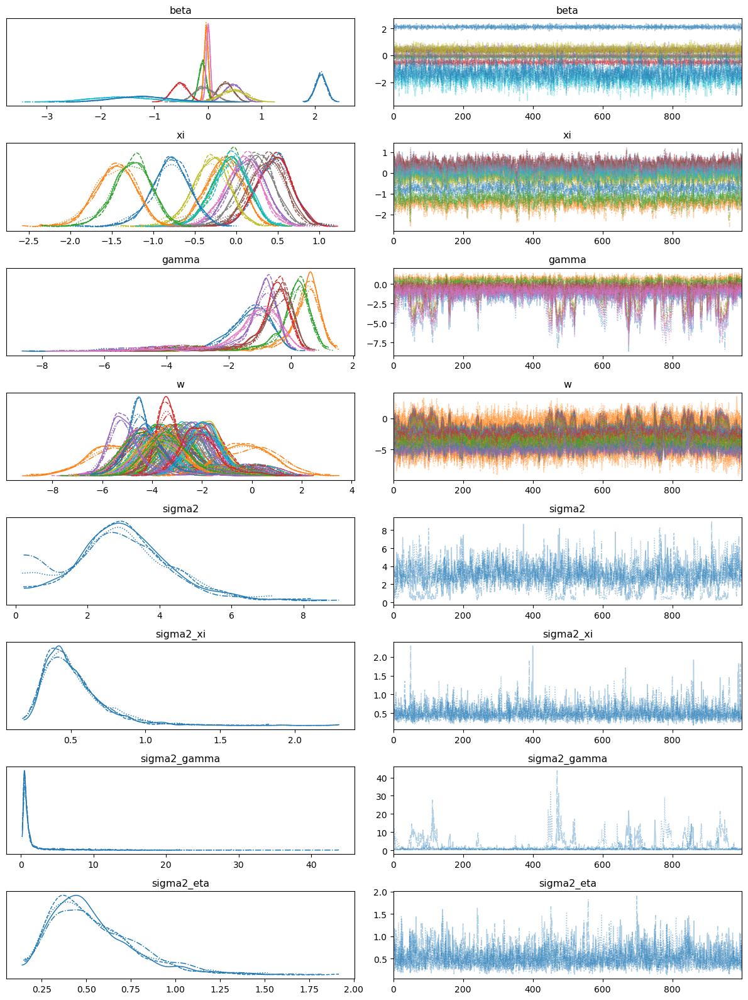

In [11]:
az.plot_trace(post_pred.posterior_az, var_names = ['beta', 'xi', 'gamma', 'w', 'sigma2', 'sigma2_xi', 'sigma2_gamma', 'sigma2_eta'])
plt.tight_layout()
plt.show()

In [12]:
waic_out = az.waic(post_pred.posterior_az, var_name='log_lik')
loo_out = az.loo(post_pred.posterior_az, var_name='log_lik')
waic = waic_out.elpd_waic
loo = loo_out.elpd_loo
print(waic_out)
print(loo_out)

C:\Users\leoma\anaconda3\Lib\site-packages\arviz\stats\stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


Computed from 4000 posterior samples and 2666 observations log-likelihood matrix.

          Estimate       SE
elpd_waic -2606.79    72.40
p_waic      123.05        -

There has been a warning during the calculation. Please check the results.
Computed from 4000 posterior samples and 2666 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -2607.81    72.45
p_loo      124.07        -
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.5]   (good)     2659   99.7%
 (0.5, 0.7]   (ok)          7    0.3%
   (0.7, 1]   (bad)         0    0.0%
   (1, Inf)   (very bad)    0    0.0%



In [13]:
alpha = 0.05
y_pred, metrics = post_pred.predict(CI=True,
                                       alpha = alpha,
                                       error_metrics = True)

In [14]:
y_obs, residuals, mse, mae, mad, mse_test, mae_test, mad_test, outliers_test, percentage_inside_CI_test, outliers, percentage_inside = metrics.values()
print(f'The total number of outliers is: {len(outliers)}\n')
print(f'The total number of outliers in the test set is: {len(outliers_test)}\n')
print(f'The MSE is: {mse}\n')
print(f'The MAE is: {mae}\n')
print(f'The MAD is: {mad}\n')
print(f'The MSE in the test set is: {mse_test}\n')
print(f'The MAE in the test set is: {mae_test}\n')
print(f'The MAD in the test set is: {mad_test}\n')
print(f'The percentage of observations inside the CI is: {percentage_inside}\n')
print(f'The percentage of observations inside the CI of the test is: {percentage_inside_CI_test}\n')

The total number of outliers is: 129

The total number of outliers in the test set is: 49

The MSE is: 2.030265231092437

The MAE is: 0.6889443277310925

The MAD is: 0.0

The MSE in the test set is: 2.266199649737303

The MAE in the test set is: 0.7267950963222417

The MAD in the test set is: 0.0

The percentage of observations inside the CI is: 0.9661239495798319

The percentage of observations inside the CI of the test is: 0.957092819614711



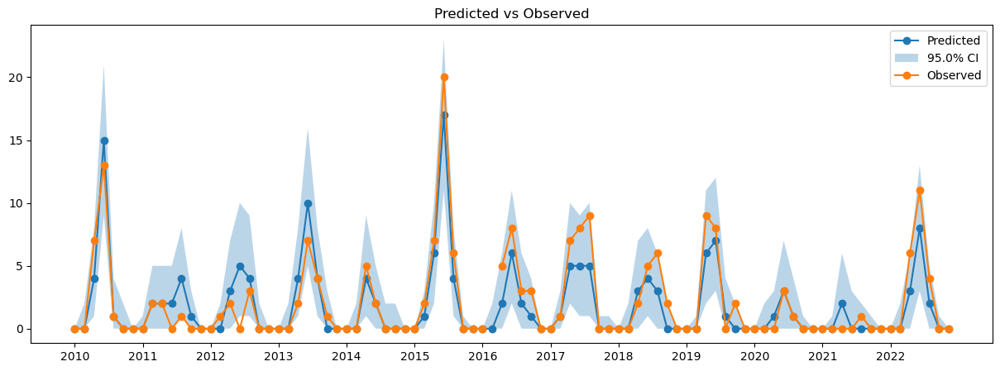

In [15]:
station_num_to_plot = 35 # Change this to plot a different station, -1 to plot manually
if station_num_to_plot != -1:
    xx = np.arange(13*7*(station_num_to_plot-1), 13*7*station_num_to_plot)
else:
    xx = np.arange(1000, 1200) # Change this for the range of the manual choice
plt.figure(figsize=(15, 5))
plt.plot(xx, y_pred.loc[xx, 'pred'], label='Predicted', linestyle='-', marker='o')
plt.fill_between(xx, y_pred.loc[xx, f'{alpha/2}'], y_pred.loc[xx, f'{(1-alpha/2)}'], alpha=0.3, label=f'{(1-alpha)*100}% CI')
plt.plot(xx, Y_data[xx], label='Observed', linestyle='-', marker='o')
plt.xticks(xx[np.arange(0,len(xx),7)], np.arange(2010,2023))
plt.legend()
plt.title('Predicted vs Observed')
plt.show()

In [16]:
Models_180_df.loc['logit',:] = [waic, loo, mse, mae, mad, percentage_inside, mse_test, mae_test, mad_test, percentage_inside_CI_test]
print(Models_180_df)

              WAIC          LOO       MSE       MAE  MAD inside CI MSE test  \
logit -2606.794291 -2607.811675  2.030265  0.688944  0.0  0.966124   2.2662   

       MAE test MAD test inside CI test  
logit  0.726795      0.0       0.957093  


In [17]:
bin_probit = FetchModel('bin_probit').compile()

19:41:46 - cmdstanpy - INFO - compiling stan file C:\Users\leoma\OneDrive\DOCUME~1\PoliMi\AAB4F7~1.23-\BAYESI~1\BAYESI~1\main\Modello\stan\bin_probit.stan to exe file C:\Users\leoma\OneDrive\Documents\PoliMi\A.A. 23-24\Bayesian statistics\Bayesian_Project\main\Modello\stan\bin_probit.exe
19:42:54 - cmdstanpy - INFO - compiled model executable: C:\Users\leoma\OneDrive\Documents\PoliMi\A.A. 23-24\Bayesian statistics\Bayesian_Project\main\Modello\stan\bin_probit.exe


In [18]:
bin_probit_180 = bin_probit.sample(data=data_180, chains=4, parallel_chains=4, 
    iter_warmup=1500, iter_sampling=1000)
posterior_bin_probit_180 = az.from_cmdstanpy(bin_probit_180)

19:42:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:01:22 - cmdstanpy - INFO - CmdStan done processing.
20:01:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: cholesky_decompose: A is not symmetric. A[1,2] = nan, but A[2,1] = nan (in 'bin_probit.stan', line 53, column 2 to column 63)
Exception: cholesky_decompose: Matrix m is not positive definite (in 'bin_probit.stan', line 53, column 2 to column 63)
Exception: cholesky_decompose: Matrix m is not positive definite (in 'bin_probit.stan', line 53, column 2 to column 63)
Consider re-running with show_console=True if the above output is unclear!


20:01:38 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 2 iterations at max treedepth (0.2%)
	Chain 4 had 1 iterations at max treedepth (0.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


In [19]:
post_pred = PostPred(posterior_bin_probit_180, Y['Count_180'], test_train=True, idx_test=idx_test)
Y_data = post_pred.Y
post_pred.posterior_az

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats

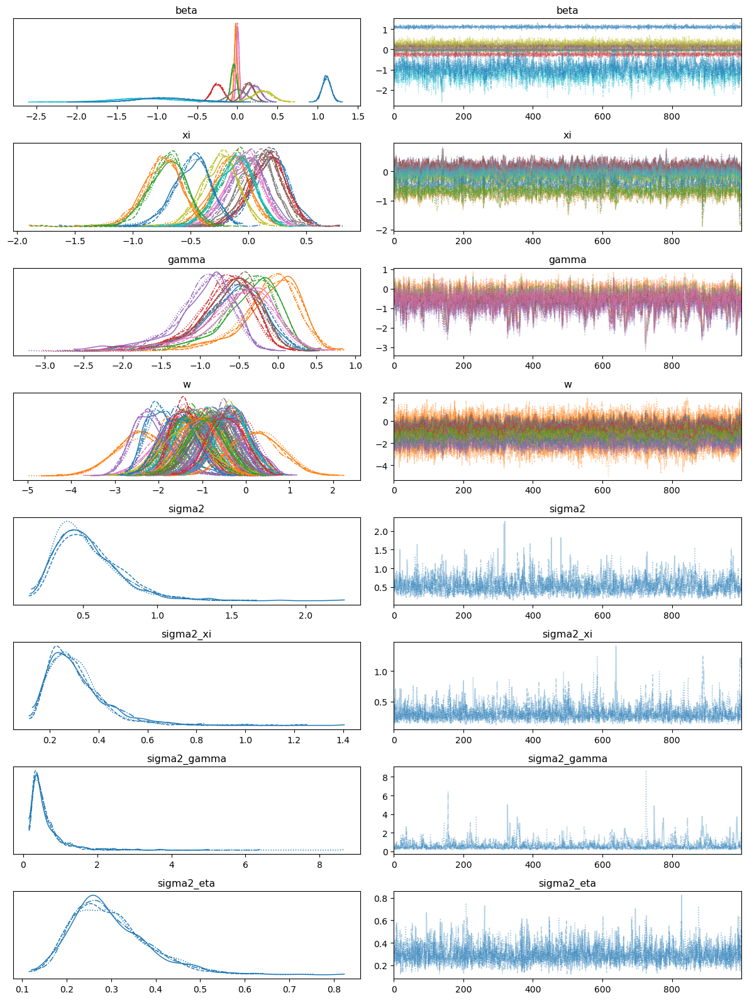

In [20]:
az.plot_trace(post_pred.posterior_az, var_names = ['beta', 'xi', 'gamma', 'w', 'sigma2', 'sigma2_xi', 'sigma2_gamma', 'sigma2_eta'])
plt.tight_layout()
plt.show()

In [21]:
waic_out = az.waic(post_pred.posterior_az, var_name='log_lik')
loo_out = az.loo(post_pred.posterior_az, var_name='log_lik')
waic = waic_out.elpd_waic
loo = loo_out.elpd_loo
print(waic_out)
print(loo_out)

C:\Users\leoma\anaconda3\Lib\site-packages\arviz\stats\stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(
C:\Users\leoma\anaconda3\Lib\site-packages\arviz\stats\stats.py:803: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


Computed from 4000 posterior samples and 2666 observations log-likelihood matrix.

          Estimate       SE
elpd_waic -2589.33    73.58
p_waic      123.17        -

There has been a warning during the calculation. Please check the results.
Computed from 4000 posterior samples and 2666 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -2590.32    73.64
p_loo      124.15        -

There has been a warning during the calculation. Please check the results.
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.5]   (good)     2656   99.6%
 (0.5, 0.7]   (ok)          8    0.3%
   (0.7, 1]   (bad)         2    0.1%
   (1, Inf)   (very bad)    0    0.0%



In [22]:
alpha = 0.05
y_pred, metrics = post_pred.predict(CI=True,
                                       alpha = alpha,
                                       error_metrics = True)

In [23]:
y_obs, residuals, mse, mae, mad, mse_test, mae_test, mad_test, outliers_test, percentage_inside_CI_test, outliers, percentage_inside = metrics.values()
print(f'The total number of outliers is: {len(outliers)}\n')
print(f'The total number of outliers in the test set is: {len(outliers_test)}\n')
print(f'The MSE is: {mse}\n')
print(f'The MAE is: {mae}\n')
print(f'The MAD is: {mad}\n')
print(f'The MSE in the test set is: {mse_test}\n')
print(f'The MAE in the test set is: {mae_test}\n')
print(f'The MAD in the test set is: {mad_test}\n')
print(f'The percentage of observations inside the CI is: {percentage_inside}\n')
print(f'The percentage of observations inside the CI of the test is: {percentage_inside_CI_test}\n')

The total number of outliers is: 138

The total number of outliers in the test set is: 51

The MSE is: 2.020220588235294

The MAE is: 0.688813025210084

The MAD is: 0.0

The MSE in the test set is: 2.2434325744308232

The MAE in the test set is: 0.7302977232924693

The MAD in the test set is: 0.0

The percentage of observations inside the CI is: 0.9637605042016807

The percentage of observations inside the CI of the test is: 0.9553415061295972



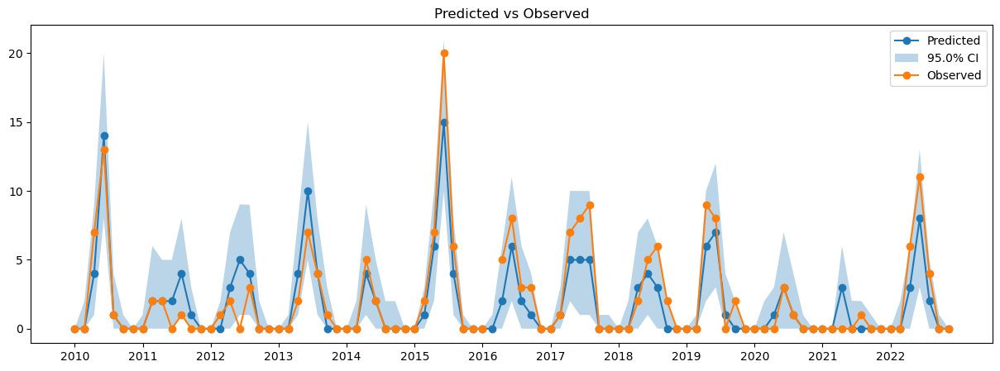

In [24]:
station_num_to_plot = 35 # Change this to plot a different station, -1 to plot manually
if station_num_to_plot != -1:
    xx = np.arange(13*7*(station_num_to_plot-1), 13*7*station_num_to_plot)
else:
    xx = np.arange(1000, 1200) # Change this for the range of the manual choice
plt.figure(figsize=(15, 5))
plt.plot(xx, y_pred.loc[xx, 'pred'], label='Predicted', linestyle='-', marker='o')
plt.fill_between(xx, y_pred.loc[xx, f'{alpha/2}'], y_pred.loc[xx, f'{(1-alpha/2)}'], alpha=0.3, label=f'{(1-alpha)*100}% CI')
plt.plot(xx, Y_data[xx], label='Observed', linestyle='-', marker='o')
plt.xticks(xx[np.arange(0,len(xx),7)], np.arange(2010,2023))
plt.legend()
plt.title('Predicted vs Observed')
plt.show()

In [25]:
Models_180_df.loc['probit', :] = [waic, loo, mse, mae, mad, percentage_inside, mse_test, mae_test, mad_test, percentage_inside_CI_test]
print(Models_180_df)

               WAIC          LOO       MSE       MAE  MAD inside CI  MSE test  \
logit  -2606.794291 -2607.811675  2.030265  0.688944  0.0  0.966124    2.2662   
probit -2589.332526 -2590.317645  2.020221  0.688813  0.0  0.963761  2.243433   

        MAE test MAD test inside CI test  
logit   0.726795      0.0       0.957093  
probit  0.730298      0.0       0.955342  


In [26]:
bin_logit_var = FetchModel('bin_logit_var').compile()

20:03:04 - cmdstanpy - INFO - compiling stan file C:\Users\leoma\OneDrive\DOCUME~1\PoliMi\AAB4F7~1.23-\BAYESI~1\BAYESI~1\main\Modello\stan\bin_logit_var.stan to exe file C:\Users\leoma\OneDrive\Documents\PoliMi\A.A. 23-24\Bayesian statistics\Bayesian_Project\main\Modello\stan\bin_logit_var.exe
20:04:04 - cmdstanpy - INFO - compiled model executable: C:\Users\leoma\OneDrive\Documents\PoliMi\A.A. 23-24\Bayesian statistics\Bayesian_Project\main\Modello\stan\bin_logit_var.exe


In [27]:
bin_logit_var_180 = bin_logit_var.sample(data=data_180, chains=4, parallel_chains=4, 
    iter_warmup=1000, iter_sampling=1000)
posterior_bin_logit_var_180 = az.from_cmdstanpy(bin_logit_var_180)

20:04:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:12:09 - cmdstanpy - INFO - CmdStan done processing.
20:12:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: cholesky_decompose: A is not symmetric. A[1,2] = nan, but A[2,1] = nan (in 'bin_logit_var.stan', line 53, column 2 to column 63)
Consider re-running with show_console=True if the above output is unclear!


In [28]:
post_pred = PostPred(posterior_bin_logit_var_180, Y['Count_180'], test_train=True, idx_test=idx_test)
Y_data = post_pred.Y
post_pred.posterior_az

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats

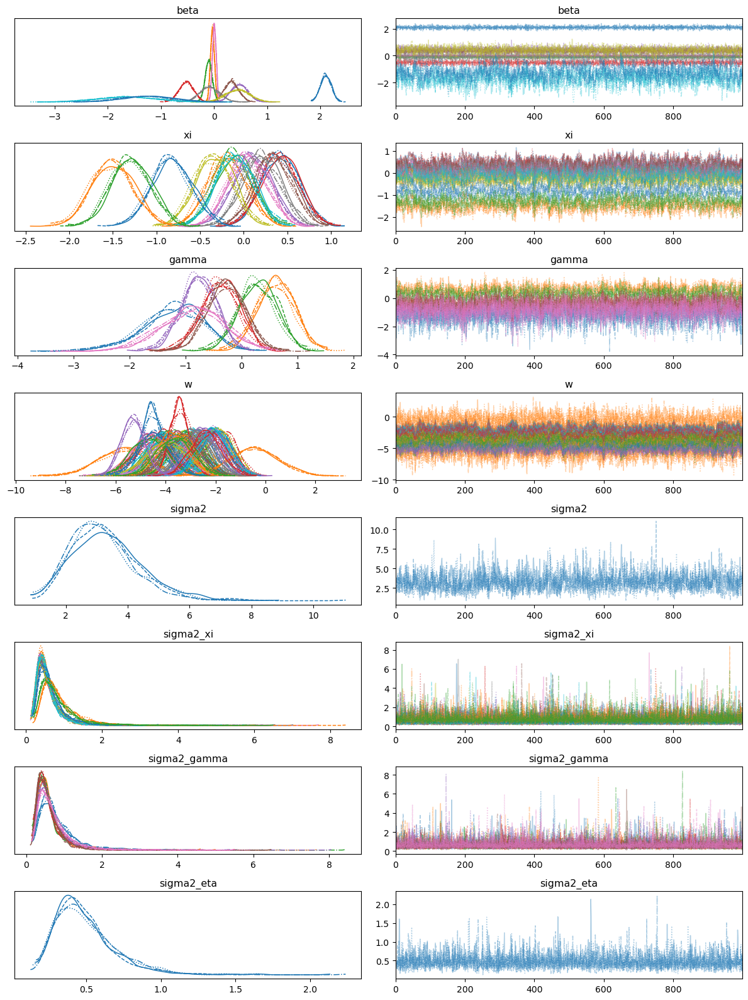

In [29]:
az.plot_trace(post_pred.posterior_az, var_names = ['beta', 'xi', 'gamma', 'w', 'sigma2', 'sigma2_xi', 'sigma2_gamma', 'sigma2_eta'])
plt.tight_layout()
plt.show()

In [30]:
waic_out = az.waic(post_pred.posterior_az, var_name='log_lik')
loo_out = az.loo(post_pred.posterior_az, var_name='log_lik')
waic = waic_out.elpd_waic
loo = loo_out.elpd_loo
print(waic_out)
print(loo_out)

C:\Users\leoma\anaconda3\Lib\site-packages\arviz\stats\stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(
C:\Users\leoma\anaconda3\Lib\site-packages\arviz\stats\stats.py:803: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


Computed from 4000 posterior samples and 2666 observations log-likelihood matrix.

          Estimate       SE
elpd_waic -2605.97    72.47
p_waic      122.45        -

There has been a warning during the calculation. Please check the results.
Computed from 4000 posterior samples and 2666 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -2607.11    72.53
p_loo      123.59        -

There has been a warning during the calculation. Please check the results.
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.5]   (good)     2661   99.8%
 (0.5, 0.7]   (ok)          4    0.2%
   (0.7, 1]   (bad)         1    0.0%
   (1, Inf)   (very bad)    0    0.0%



In [31]:
alpha = 0.05
y_pred, metrics = post_pred.predict(CI=True,
                                       alpha = alpha,
                                       error_metrics = True)

In [32]:
y_obs, residuals, mse, mae, mad, mse_test, mae_test, mad_test, outliers_test, percentage_inside_CI_test, outliers, percentage_inside = metrics.values()
print(f'The total number of outliers is: {len(outliers)}\n')
print(f'The total number of outliers in the test set is: {len(outliers_test)}\n')
print(f'The MSE is: {mse}\n')
print(f'The MAE is: {mae}\n')
print(f'The MAD is: {mad}\n')
print(f'The MSE in the test set is: {mse_test}\n')
print(f'The MAE in the test set is: {mae_test}\n')
print(f'The MAD in the test set is: {mad_test}\n')
print(f'The percentage of observations inside the CI is: {percentage_inside}\n')
print(f'The percentage of observations inside the CI of the test is: {percentage_inside_CI_test}\n')

The total number of outliers is: 125

The total number of outliers in the test set is: 48

The MSE is: 2.0175288865546217

The MAE is: 0.6881565126050421

The MAD is: 0.0

The MSE in the test set is: 2.234894921190893

The MAE in the test set is: 0.7237302977232924

The MAD in the test set is: 0.0

The percentage of observations inside the CI is: 0.9671743697478992

The percentage of observations inside the CI of the test is: 0.957968476357268



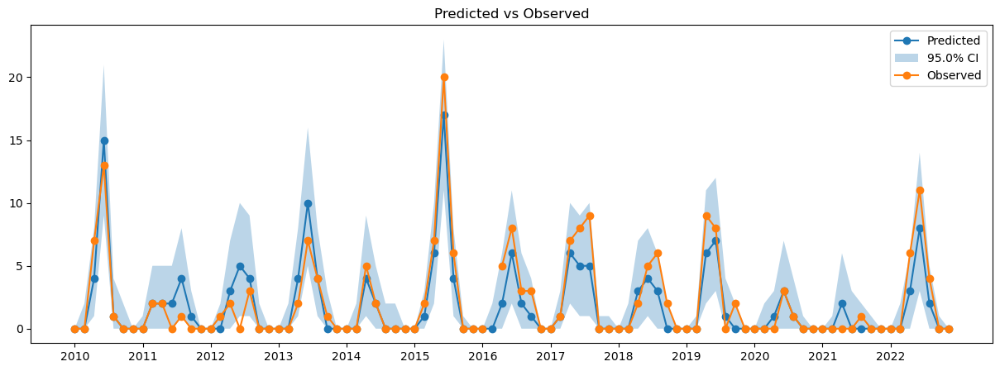

In [33]:
station_num_to_plot = 35 # Change this to plot a different station, -1 to plot manually
if station_num_to_plot != -1:
    xx = np.arange(13*7*(station_num_to_plot-1), 13*7*station_num_to_plot)
else:
    xx = np.arange(1000, 1200) # Change this for the range of the manual choice
plt.figure(figsize=(15, 5))
plt.plot(xx, y_pred.loc[xx, 'pred'], label='Predicted', linestyle='-', marker='o')
plt.fill_between(xx, y_pred.loc[xx, f'{alpha/2}'], y_pred.loc[xx, f'{(1-alpha/2)}'], alpha=0.3, label=f'{(1-alpha)*100}% CI')
plt.plot(xx, Y_data[xx], label='Observed', linestyle='-', marker='o')
plt.xticks(xx[np.arange(0,len(xx),7)], np.arange(2010,2023))
plt.legend()
plt.title('Predicted vs Observed')
plt.show()

In [34]:
Models_180_df.loc['logit var', :] = [waic, loo, mse, mae, mad, percentage_inside, mse_test, mae_test, mad_test, percentage_inside_CI_test]
print(Models_180_df)

                  WAIC          LOO       MSE       MAE  MAD inside CI  \
logit     -2606.794291 -2607.811675  2.030265  0.688944  0.0  0.966124   
probit    -2589.332526 -2590.317645  2.020221  0.688813  0.0  0.963761   
logit var -2605.973022 -2607.108636  2.017529  0.688157  0.0  0.967174   

           MSE test  MAE test MAD test inside CI test  
logit        2.2662  0.726795      0.0       0.957093  
probit     2.243433  0.730298      0.0       0.955342  
logit var  2.234895   0.72373      0.0       0.957968  


In [35]:
bin_probit_var = FetchModel('bin_probit_var').compile()

20:13:16 - cmdstanpy - INFO - compiling stan file C:\Users\leoma\OneDrive\DOCUME~1\PoliMi\AAB4F7~1.23-\BAYESI~1\BAYESI~1\main\Modello\stan\bin_probit_var.stan to exe file C:\Users\leoma\OneDrive\Documents\PoliMi\A.A. 23-24\Bayesian statistics\Bayesian_Project\main\Modello\stan\bin_probit_var.exe
20:14:14 - cmdstanpy - INFO - compiled model executable: C:\Users\leoma\OneDrive\Documents\PoliMi\A.A. 23-24\Bayesian statistics\Bayesian_Project\main\Modello\stan\bin_probit_var.exe


In [36]:
bin_probit_var_180 = bin_probit_var.sample(data=data_180, chains=4, parallel_chains=4, 
    iter_warmup=1000, iter_sampling=1000)
posterior_bin_probit_var_180 = az.from_cmdstanpy(bin_probit_var_180)

20:14:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:26:41 - cmdstanpy - INFO - CmdStan done processing.
20:26:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: cholesky_decompose: A is not symmetric. A[1,2] = inf, but A[2,1] = inf (in 'bin_probit_var.stan', line 53, column 2 to column 63)
Exception: cholesky_decompose: Matrix m is not positive definite (in 'bin_probit_var.stan', line 53, column 2 to column 63)
Consider re-running with show_console=True if the above output is unclear!


20:26:50 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 3 had 1 iterations at max treedepth (0.1%)
	Chain 4 had 1 iterations at max treedepth (0.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


In [37]:
post_pred = PostPred(posterior_bin_probit_var_180, Y['Count_180'], test_train=True, idx_test=idx_test)
Y_data = post_pred.Y
post_pred.posterior_az

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats

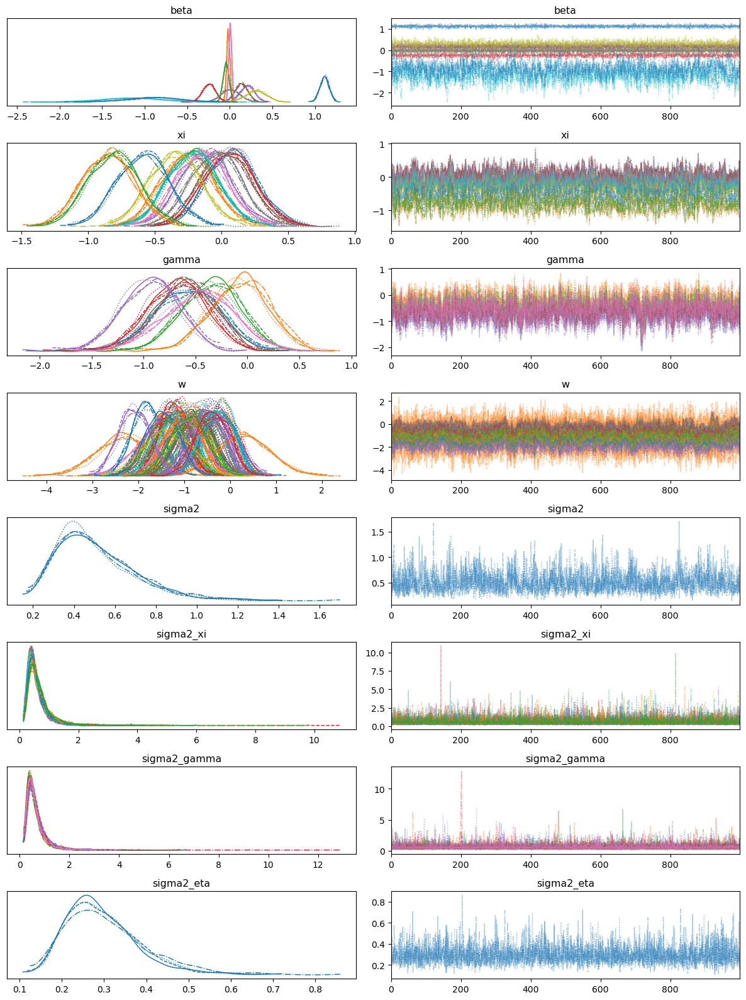

In [38]:
az.plot_trace(post_pred.posterior_az, var_names = ['beta', 'xi', 'gamma', 'w', 'sigma2', 'sigma2_xi', 'sigma2_gamma', 'sigma2_eta'])
plt.tight_layout()
plt.show()

In [39]:
waic_out = az.waic(post_pred.posterior_az, var_name='log_lik')
loo_out = az.loo(post_pred.posterior_az, var_name='log_lik')
waic = waic_out.elpd_waic
loo = loo_out.elpd_loo
print(waic_out)
print(loo_out)

C:\Users\leoma\anaconda3\Lib\site-packages\arviz\stats\stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(
C:\Users\leoma\anaconda3\Lib\site-packages\arviz\stats\stats.py:803: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


Computed from 4000 posterior samples and 2666 observations log-likelihood matrix.

          Estimate       SE
elpd_waic -2589.24    73.64
p_waic      123.24        -

There has been a warning during the calculation. Please check the results.
Computed from 4000 posterior samples and 2666 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -2590.08    73.68
p_loo      124.08        -

There has been a warning during the calculation. Please check the results.
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.5]   (good)     2660   99.8%
 (0.5, 0.7]   (ok)          5    0.2%
   (0.7, 1]   (bad)         1    0.0%
   (1, Inf)   (very bad)    0    0.0%



In [40]:
alpha = 0.05
y_pred, metrics = post_pred.predict(CI=True,
                                       alpha = alpha,
                                       error_metrics = True)

In [41]:
y_obs, residuals, mse, mae, mad, mse_test, mae_test, mad_test, outliers_test, percentage_inside_CI_test, outliers, percentage_inside = metrics.values()
print(f'The total number of outliers is: {len(outliers)}\n')
print(f'The total number of outliers in the test set is: {len(outliers_test)}\n')
print(f'The MSE is: {mse}\n')
print(f'The MAE is: {mae}\n')
print(f'The MAD is: {mad}\n')
print(f'The MSE in the test set is: {mse_test}\n')
print(f'The MAE in the test set is: {mae_test}\n')
print(f'The MAD in the test set is: {mad_test}\n')
print(f'The percentage of observations inside the CI is: {percentage_inside}\n')
print(f'The percentage of observations inside the CI of the test is: {percentage_inside_CI_test}\n')

The total number of outliers is: 139

The total number of outliers in the test set is: 54

The MSE is: 2.0093224789915967

The MAE is: 0.6882878151260504

The MAD is: 0.0

The MSE in the test set is: 2.241024518388792

The MAE in the test set is: 0.7333625218914186

The MAD in the test set is: 0.0

The percentage of observations inside the CI is: 0.9634978991596639

The percentage of observations inside the CI of the test is: 0.9527145359019265



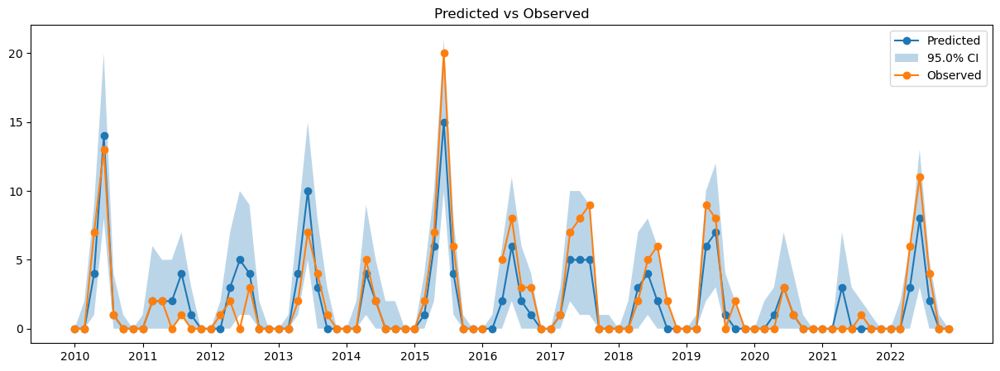

In [42]:
station_num_to_plot = 35 # Change this to plot a different station, -1 to plot manually
if station_num_to_plot != -1:
    xx = np.arange(13*7*(station_num_to_plot-1), 13*7*station_num_to_plot)
else:
    xx = np.arange(1000, 1200) # Change this for the range of the manual choice
plt.figure(figsize=(15, 5))
plt.plot(xx, y_pred.loc[xx, 'pred'], label='Predicted', linestyle='-', marker='o')
plt.fill_between(xx, y_pred.loc[xx, f'{alpha/2}'], y_pred.loc[xx, f'{(1-alpha/2)}'], alpha=0.3, label=f'{(1-alpha)*100}% CI')
plt.plot(xx, Y_data[xx], label='Observed', linestyle='-', marker='o')
plt.xticks(xx[np.arange(0,len(xx),7)], np.arange(2010,2023))
plt.legend()
plt.title('Predicted vs Observed')
plt.show()

In [43]:
Models_180_df.loc['probit var', :] = [waic, loo, mse, mae, mad, percentage_inside, mse_test, mae_test, mad_test, percentage_inside_CI_test]
print(Models_180_df)

                   WAIC          LOO       MSE       MAE  MAD inside CI  \
logit      -2606.794291 -2607.811675  2.030265  0.688944  0.0  0.966124   
probit     -2589.332526 -2590.317645  2.020221  0.688813  0.0  0.963761   
logit var  -2605.973022 -2607.108636  2.017529  0.688157  0.0  0.967174   
probit var -2589.237173 -2590.084898  2.009322  0.688288  0.0  0.963498   

            MSE test  MAE test MAD test inside CI test  
logit         2.2662  0.726795      0.0       0.957093  
probit      2.243433  0.730298      0.0       0.955342  
logit var   2.234895   0.72373      0.0       0.957968  
probit var  2.241025  0.733363      0.0       0.952715  


# 120

In [44]:
Y = pd.read_csv("../Datasets/Dataset_120.csv")
Y['Count_120'] = pd.to_numeric(Y['Count_120']).astype('Int64')
X = pd.read_csv("../Datasets/variables_to_select.csv")

In [45]:
idx_obs = Y[Y['Count_120'].notna()].index
idx_miss = Y[Y['Count_120'].isna()].index

# take XX% of the remaining indexes for a test set
XX = 0.3 # [0, 1] change this value to change the size of the test set
idx_test = sorted(np.random.choice(idx_obs.values, int(XX*len(idx_obs)), replace=False))
idx_miss = sorted(np.concatenate((idx_test, idx_miss.values)))
idx_obs = sorted(np.setdiff1d(idx_obs, idx_test))

Y_obs = Y.loc[idx_obs, :].reset_index(drop=True)
Y_miss = Y.loc[idx_miss, :].reset_index(drop=True)

X_obs = X.loc[idx_obs, :].reset_index(drop=True)
X_miss = X.loc[idx_miss, :].reset_index(drop=True)

In [46]:
stations = Y['idSensore']
years = pd.Series(Y['Year'] - 2009)
months = pd.Series(Y['Month'] - 3)
unique_values = sorted(set(stations))
mapping_dict = {value: index + 1 for index, value in enumerate(unique_values)}
transformed_stations = [mapping_dict[value] for value in stations]
stations_original = pd.Series(stations)
stations = pd.Series(transformed_stations)

stations_obs = stations.loc[idx_obs].reset_index(drop=True)
stations_miss = stations.loc[idx_miss].reset_index(drop=True)
years_obs = years.loc[idx_obs].reset_index(drop=True)
years_miss = years.loc[idx_miss].reset_index(drop=True)
months_obs = months.loc[idx_obs].reset_index(drop=True)
months_miss = months.loc[idx_miss].reset_index(drop=True)


day_in_month = [31,28,31,30,31,30,31,31,30,31,30,31]

max_month = [day_in_month[Y['Month'][i]-1] for i in range(0,Y.shape[0]) ]

max_month = pd.Series(max_month)
max_month_obs = max_month.loc[idx_obs].reset_index(drop=True)
max_month_miss = max_month.loc[idx_miss].reset_index(drop=True)

In [47]:
phi = 63
distances = pd.read_csv("../Datasets/distances.csv", index_col=0)

In [48]:
data_120 = {
    "N": len(Y_obs),
    "N_miss": len(Y_miss),

    "y": Y_obs['Count_120'],
    "P": X_obs.shape[1],

    "nyears": 13,
    "nstations": 45,
    "nmonths": 7,

    "station": stations_obs,
    "year": years_obs,
    "max_month": max_month_obs,
    "station_miss": stations_miss,
    "year_miss": years_miss,
    "max_month_miss": max_month_miss,

    "X": X_obs,
    "X_miss": X_miss,

    "phi": phi,
    "distances": distances,

    "month": months_obs,
    "month_miss": months_miss
}

In [49]:
Models_120_df = pd.DataFrame(columns = ['WAIC', 'LOO', 'MSE', 'MAE', 'MAD', 'inside CI', 'MSE test', 'MAE test', 'MAD test', 'inside CI test'])

In [50]:
bin_logit = FetchModel('bin_logit').compile()

20:27:48 - cmdstanpy - INFO - compiling stan file C:\Users\leoma\OneDrive\DOCUME~1\PoliMi\AAB4F7~1.23-\BAYESI~1\BAYESI~1\main\Modello\stan\bin_logit.stan to exe file C:\Users\leoma\OneDrive\Documents\PoliMi\A.A. 23-24\Bayesian statistics\Bayesian_Project\main\Modello\stan\bin_logit.exe
20:28:39 - cmdstanpy - INFO - compiled model executable: C:\Users\leoma\OneDrive\Documents\PoliMi\A.A. 23-24\Bayesian statistics\Bayesian_Project\main\Modello\stan\bin_logit.exe


In [51]:
bin_logit_120 = bin_logit.sample(data=data_120, chains=4, parallel_chains=4, 
    iter_warmup=1000, iter_sampling=1000)
posterior_bin_logit_120 = az.from_cmdstanpy(bin_logit_120)

20:28:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:40:25 - cmdstanpy - INFO - CmdStan done processing.
20:40:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: cholesky_decompose: Matrix m is not positive definite (in 'bin_logit.stan', line 53, column 2 to column 63)
Exception: cholesky_decompose: Matrix m is not positive definite (in 'bin_logit.stan', line 53, column 2 to column 63)
Consider re-running with show_console=True if the above output is unclear!


20:40:33 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 4 had 2 iterations at max treedepth (0.2%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


In [52]:
post_pred = PostPred(posterior_bin_logit_120, Y['Count_120'], test_train=True, idx_test=idx_test)
Y_data = post_pred.Y
post_pred.posterior_az

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats

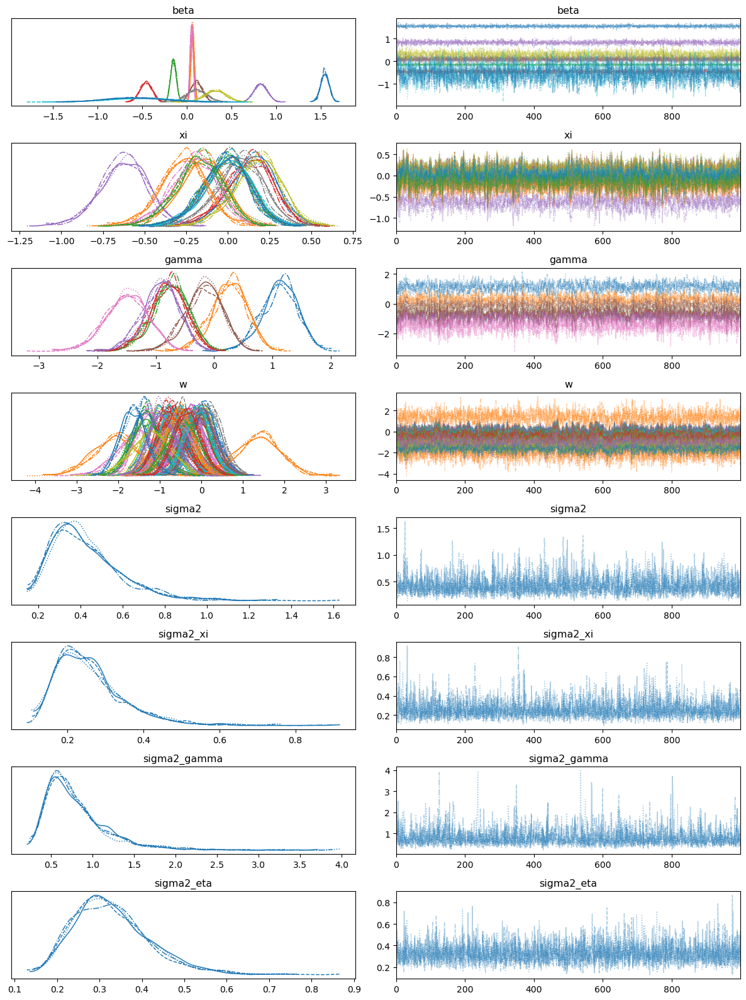

In [53]:
az.plot_trace(post_pred.posterior_az, var_names = ['beta', 'xi', 'gamma', 'w', 'sigma2', 'sigma2_xi', 'sigma2_gamma', 'sigma2_eta'])
plt.tight_layout()
plt.show()

In [54]:
waic_out = az.waic(post_pred.posterior_az, var_name='log_lik')
loo_out = az.loo(post_pred.posterior_az, var_name='log_lik')
waic = waic_out.elpd_waic
loo = loo_out.elpd_loo
print(waic_out)
print(loo_out)

C:\Users\leoma\anaconda3\Lib\site-packages\arviz\stats\stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


Computed from 4000 posterior samples and 2688 observations log-likelihood matrix.

          Estimate       SE
elpd_waic -6671.89   101.75
p_waic      161.93        -

There has been a warning during the calculation. Please check the results.
Computed from 4000 posterior samples and 2688 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -6672.26   101.76
p_loo      162.29        -
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.5]   (good)     2688  100.0%
 (0.5, 0.7]   (ok)          0    0.0%
   (0.7, 1]   (bad)         0    0.0%
   (1, Inf)   (very bad)    0    0.0%



In [55]:
alpha = 0.05
y_pred, metrics = post_pred.predict(CI=True,
                                       alpha = alpha,
                                       error_metrics = True)

In [56]:
y_obs, residuals, mse, mae, mad, mse_test, mae_test, mad_test, outliers_test, percentage_inside_CI_test, outliers, percentage_inside = metrics.values()
print(f'The total number of outliers is: {len(outliers)}\n')
print(f'The total number of outliers in the test set is: {len(outliers_test)}\n')
print(f'The MSE is: {mse}\n')
print(f'The MAE is: {mae}\n')
print(f'The MAD is: {mad}\n')
print(f'The MSE in the test set is: {mse_test}\n')
print(f'The MAE in the test set is: {mae_test}\n')
print(f'The MAD in the test set is: {mad_test}\n')
print(f'The percentage of observations inside the CI is: {percentage_inside}\n')
print(f'The percentage of observations inside the CI of the test is: {percentage_inside_CI_test}\n')

The total number of outliers is: 465

The total number of outliers in the test set is: 157

The MSE is: 10.3380859375

The MAE is: 2.293098958333333

The MAD is: 2.0

The MSE in the test set is: 10.818793402777779

The MAE in the test set is: 2.377170138888889

The MAD in the test set is: 2.0

The percentage of observations inside the CI is: 0.87890625

The percentage of observations inside the CI of the test is: 0.8637152777777778



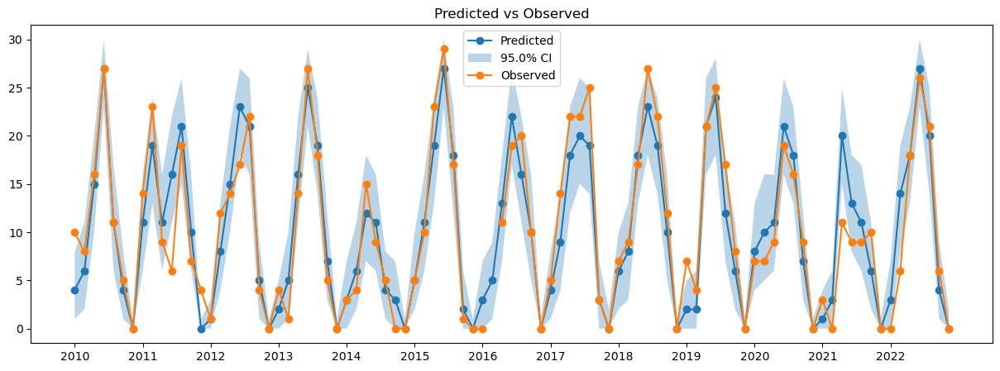

In [57]:
station_num_to_plot = 35 # Change this to plot a different station, -1 to plot manually
if station_num_to_plot != -1:
    xx = np.arange(13*7*(station_num_to_plot-1), 13*7*station_num_to_plot)
else:
    xx = np.arange(1000, 1200) # Change this for the range of the manual choice
plt.figure(figsize=(15, 5))
plt.plot(xx, y_pred.loc[xx, 'pred'], label='Predicted', linestyle='-', marker='o')
plt.fill_between(xx, y_pred.loc[xx, f'{alpha/2}'], y_pred.loc[xx, f'{(1-alpha/2)}'], alpha=0.3, label=f'{(1-alpha)*100}% CI')
plt.plot(xx, Y_data[xx], label='Observed', linestyle='-', marker='o')
plt.xticks(xx[np.arange(0,len(xx),7)], np.arange(2010,2023))
plt.legend()
plt.title('Predicted vs Observed')
plt.show()

In [58]:
Models_120_df.loc['logit',:] = [waic, loo, mse, mae, mad, percentage_inside, mse_test, mae_test, mad_test, percentage_inside_CI_test]
print(Models_120_df)

              WAIC          LOO        MSE       MAE  MAD inside CI  \
logit -6671.889569 -6672.255815  10.338086  2.293099  2.0  0.878906   

        MSE test MAE test MAD test inside CI test  
logit  10.818793  2.37717      2.0       0.863715  


In [59]:
bin_probit = FetchModel('bin_probit').compile()

In [60]:
bin_probit_120 = bin_probit.sample(data=data_120, chains=4, parallel_chains=4, 
    iter_warmup=1000, iter_sampling=1000)
posterior_bin_probit_120 = az.from_cmdstanpy(bin_probit_120)

20:41:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:55:08 - cmdstanpy - INFO - CmdStan done processing.
20:55:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: cholesky_decompose: A is not symmetric. A[1,2] = nan, but A[2,1] = nan (in 'bin_probit.stan', line 53, column 2 to column 63)
Exception: cholesky_decompose: Matrix m is not positive definite (in 'bin_probit.stan', line 53, column 2 to column 63)
Consider re-running with show_console=True if the above output is unclear!


20:55:17 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 1 iterations at max treedepth (0.1%)
	Chain 2 had 2 iterations at max treedepth (0.2%)
	Chain 4 had 20 iterations at max treedepth (2.0%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


In [61]:
post_pred = PostPred(posterior_bin_probit_120, Y['Count_120'], test_train=True, idx_test=idx_test)
Y_data = post_pred.Y
post_pred.posterior_az

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats

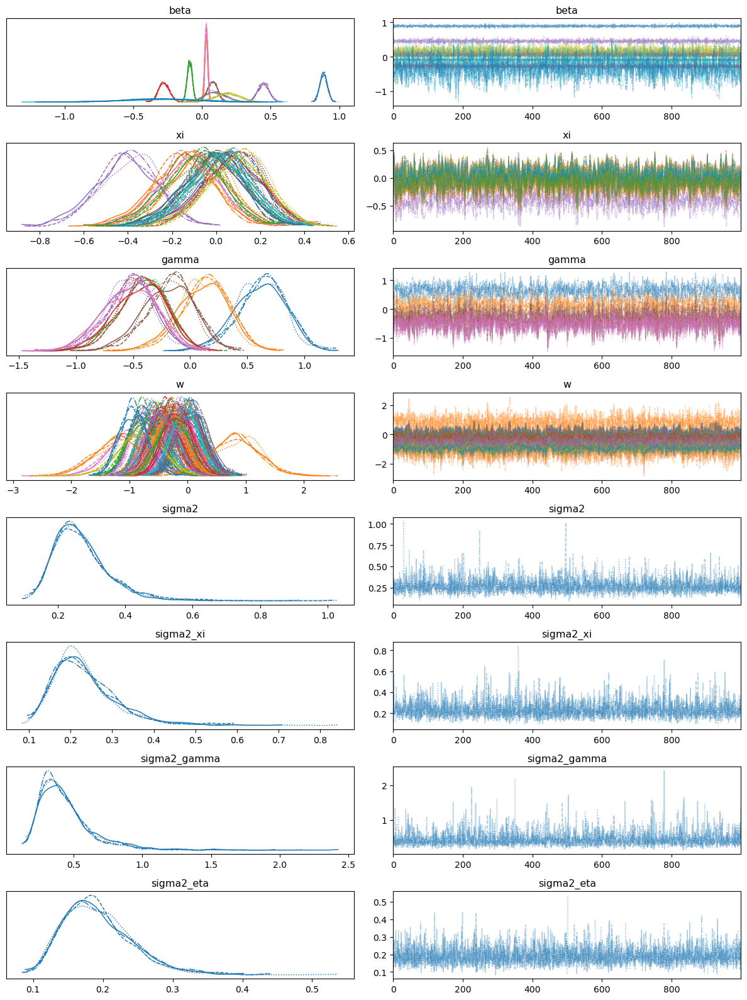

In [62]:
az.plot_trace(post_pred.posterior_az, var_names = ['beta', 'xi', 'gamma', 'w', 'sigma2', 'sigma2_xi', 'sigma2_gamma', 'sigma2_eta'])
plt.tight_layout()
plt.show()

In [63]:
waic_out = az.waic(post_pred.posterior_az, var_name='log_lik')
loo_out = az.loo(post_pred.posterior_az, var_name='log_lik')
waic = waic_out.elpd_waic
loo = loo_out.elpd_loo
print(waic_out)
print(loo_out)

C:\Users\leoma\anaconda3\Lib\site-packages\arviz\stats\stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


Computed from 4000 posterior samples and 2688 observations log-likelihood matrix.

          Estimate       SE
elpd_waic -6707.43   103.75
p_waic      165.15        -

There has been a warning during the calculation. Please check the results.
Computed from 4000 posterior samples and 2688 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -6707.78   103.76
p_loo      165.50        -
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.5]   (good)     2688  100.0%
 (0.5, 0.7]   (ok)          0    0.0%
   (0.7, 1]   (bad)         0    0.0%
   (1, Inf)   (very bad)    0    0.0%



In [64]:
alpha = 0.05
y_pred, metrics = post_pred.predict(CI=True,
                                       alpha = alpha,
                                       error_metrics = True)

In [65]:
y_obs, residuals, mse, mae, mad, mse_test, mae_test, mad_test, outliers_test, percentage_inside_CI_test, outliers, percentage_inside = metrics.values()
print(f'The total number of outliers is: {len(outliers)}\n')
print(f'The total number of outliers in the test set is: {len(outliers_test)}\n')
print(f'The MSE is: {mse}\n')
print(f'The MAE is: {mae}\n')
print(f'The MAD is: {mad}\n')
print(f'The MSE in the test set is: {mse_test}\n')
print(f'The MAE in the test set is: {mae_test}\n')
print(f'The MAD in the test set is: {mad_test}\n')
print(f'The percentage of observations inside the CI is: {percentage_inside}\n')
print(f'The percentage of observations inside the CI of the test is: {percentage_inside_CI_test}\n')

The total number of outliers is: 486

The total number of outliers in the test set is: 159

The MSE is: 10.450716145833333

The MAE is: 2.316536458333333

The MAD is: 2.0

The MSE in the test set is: 11.016493055555555

The MAE in the test set is: 2.4053819444444446

The MAD in the test set is: 2.0

The percentage of observations inside the CI is: 0.8734375

The percentage of observations inside the CI of the test is: 0.8619791666666666



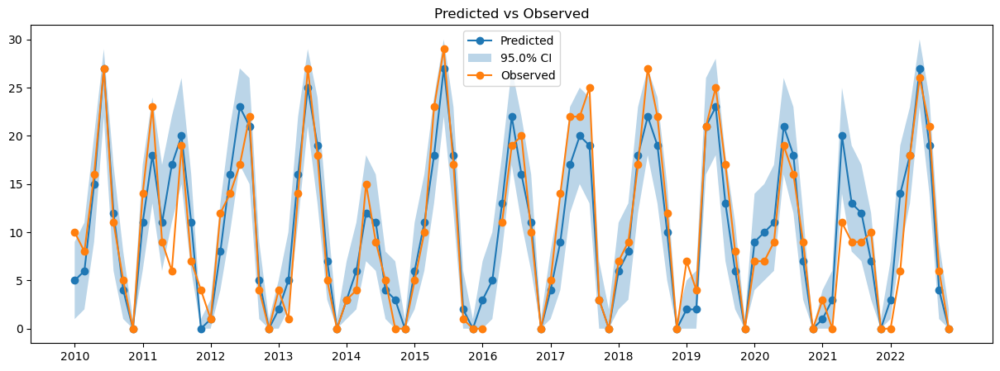

In [66]:
station_num_to_plot = 35 # Change this to plot a different station, -1 to plot manually
if station_num_to_plot != -1:
    xx = np.arange(13*7*(station_num_to_plot-1), 13*7*station_num_to_plot)
else:
    xx = np.arange(1000, 1200) # Change this for the range of the manual choice
plt.figure(figsize=(15, 5))
plt.plot(xx, y_pred.loc[xx, 'pred'], label='Predicted', linestyle='-', marker='o')
plt.fill_between(xx, y_pred.loc[xx, f'{alpha/2}'], y_pred.loc[xx, f'{(1-alpha/2)}'], alpha=0.3, label=f'{(1-alpha)*100}% CI')
plt.plot(xx, Y_data[xx], label='Observed', linestyle='-', marker='o')
plt.xticks(xx[np.arange(0,len(xx),7)], np.arange(2010,2023))
plt.legend()
plt.title('Predicted vs Observed')
plt.show()

In [67]:
Models_120_df.loc['probit', :] = [waic, loo, mse, mae, mad, percentage_inside, mse_test, mae_test, mad_test, percentage_inside_CI_test]
print(Models_120_df)

               WAIC          LOO        MSE       MAE  MAD inside CI  \
logit  -6671.889569 -6672.255815  10.338086  2.293099  2.0  0.878906   
probit -6707.434133 -6707.783995  10.450716  2.316536  2.0  0.873437   

         MSE test  MAE test MAD test inside CI test  
logit   10.818793   2.37717      2.0       0.863715  
probit  11.016493  2.405382      2.0       0.861979  


In [68]:
bin_logit_var = FetchModel('bin_logit_var').compile()

In [69]:
bin_logit_var_120 = bin_logit_var.sample(data=data_120, chains=4, parallel_chains=4, 
    iter_warmup=1000, iter_sampling=1000)
posterior_bin_logit_var_120 = az.from_cmdstanpy(bin_logit_var_120)

20:56:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:05:59 - cmdstanpy - INFO - CmdStan done processing.


21:06:07 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 2 had 5 iterations at max treedepth (0.5%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


In [70]:
post_pred = PostPred(posterior_bin_logit_var_120, Y['Count_120'], test_train=True, idx_test=idx_test)
Y_data = post_pred.Y
post_pred.posterior_az

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats

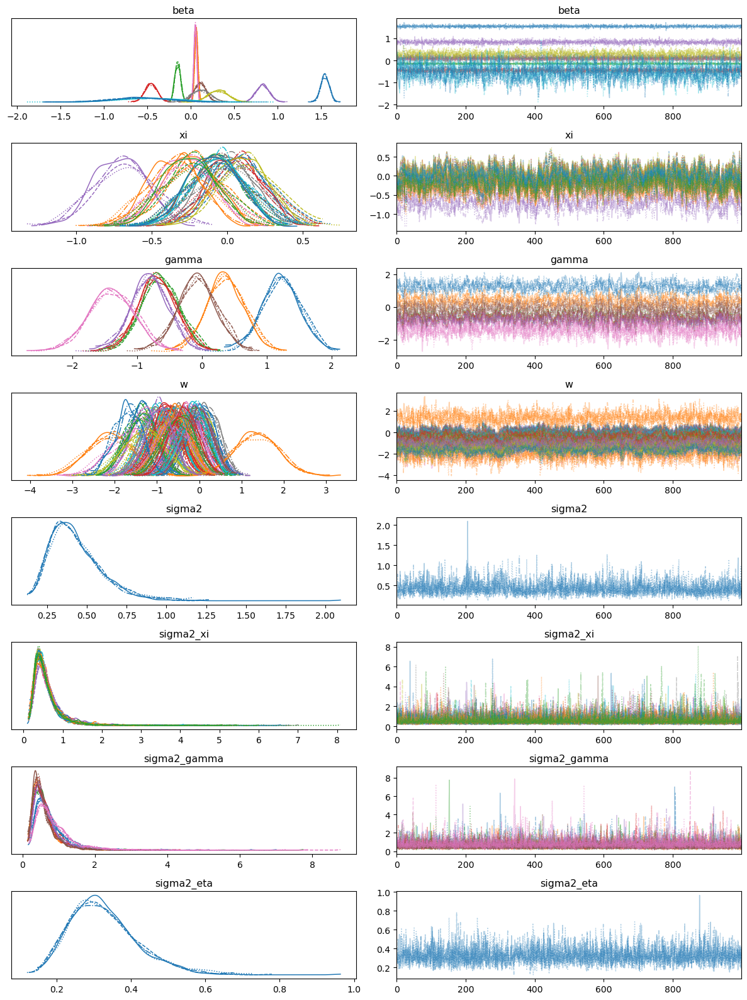

In [71]:
az.plot_trace(post_pred.posterior_az, var_names = ['beta', 'xi', 'gamma', 'w', 'sigma2', 'sigma2_xi', 'sigma2_gamma', 'sigma2_eta'])
plt.tight_layout()
plt.show()

In [72]:
waic_out = az.waic(post_pred.posterior_az, var_name='log_lik')
loo_out = az.loo(post_pred.posterior_az, var_name='log_lik')
waic = waic_out.elpd_waic
loo = loo_out.elpd_loo
print(waic_out)
print(loo_out)

C:\Users\leoma\anaconda3\Lib\site-packages\arviz\stats\stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


Computed from 4000 posterior samples and 2688 observations log-likelihood matrix.

          Estimate       SE
elpd_waic -6672.55   101.78
p_waic      162.77        -

There has been a warning during the calculation. Please check the results.
Computed from 4000 posterior samples and 2688 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -6672.94   101.79
p_loo      163.16        -
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.5]   (good)     2688  100.0%
 (0.5, 0.7]   (ok)          0    0.0%
   (0.7, 1]   (bad)         0    0.0%
   (1, Inf)   (very bad)    0    0.0%



In [73]:
alpha = 0.05
y_pred, metrics = post_pred.predict(CI=True,
                                       alpha = alpha,
                                       error_metrics = True)

In [74]:
y_obs, residuals, mse, mae, mad, mse_test, mae_test, mad_test, outliers_test, percentage_inside_CI_test, outliers, percentage_inside = metrics.values()
print(f'The total number of outliers is: {len(outliers)}\n')
print(f'The total number of outliers in the test set is: {len(outliers_test)}\n')
print(f'The MSE is: {mse}\n')
print(f'The MAE is: {mae}\n')
print(f'The MAD is: {mad}\n')
print(f'The MSE in the test set is: {mse_test}\n')
print(f'The MAE in the test set is: {mae_test}\n')
print(f'The MAD in the test set is: {mad_test}\n')
print(f'The percentage of observations inside the CI is: {percentage_inside}\n')
print(f'The percentage of observations inside the CI of the test is: {percentage_inside_CI_test}\n')

The total number of outliers is: 464

The total number of outliers in the test set is: 157

The MSE is: 10.28046875

The MAE is: 2.287239583333333

The MAD is: 2.0

The MSE in the test set is: 10.768229166666666

The MAE in the test set is: 2.3706597222222223

The MAD in the test set is: 2.0

The percentage of observations inside the CI is: 0.8791666666666667

The percentage of observations inside the CI of the test is: 0.8637152777777778



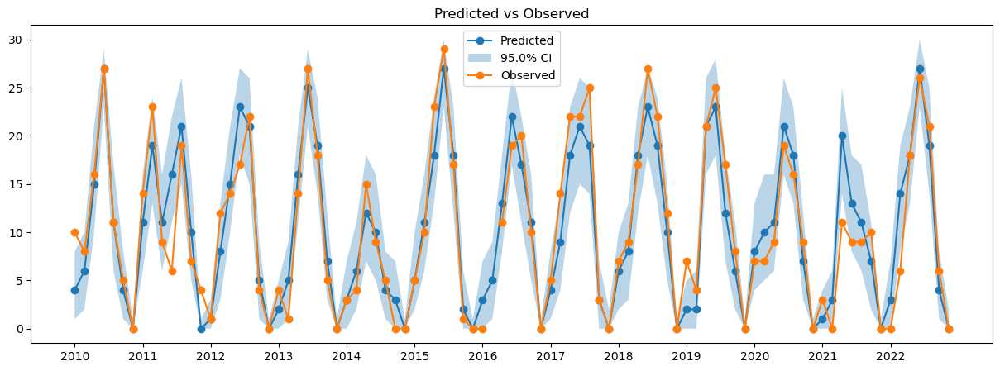

In [75]:
station_num_to_plot = 35 # Change this to plot a different station, -1 to plot manually
if station_num_to_plot != -1:
    xx = np.arange(13*7*(station_num_to_plot-1), 13*7*station_num_to_plot)
else:
    xx = np.arange(1000, 1200) # Change this for the range of the manual choice
plt.figure(figsize=(15, 5))
plt.plot(xx, y_pred.loc[xx, 'pred'], label='Predicted', linestyle='-', marker='o')
plt.fill_between(xx, y_pred.loc[xx, f'{alpha/2}'], y_pred.loc[xx, f'{(1-alpha/2)}'], alpha=0.3, label=f'{(1-alpha)*100}% CI')
plt.plot(xx, Y_data[xx], label='Observed', linestyle='-', marker='o')
plt.xticks(xx[np.arange(0,len(xx),7)], np.arange(2010,2023))
plt.legend()
plt.title('Predicted vs Observed')
plt.show()

In [76]:
Models_120_df.loc['logit var', :] = [waic, loo, mse, mae, mad, percentage_inside, mse_test, mae_test, mad_test, percentage_inside_CI_test]
print(Models_120_df)

                  WAIC          LOO        MSE       MAE  MAD inside CI  \
logit     -6671.889569 -6672.255815  10.338086  2.293099  2.0  0.878906   
probit    -6707.434133 -6707.783995  10.450716  2.316536  2.0  0.873437   
logit var -6672.548816 -6672.936713  10.280469   2.28724  2.0  0.879167   

            MSE test  MAE test MAD test inside CI test  
logit      10.818793   2.37717      2.0       0.863715  
probit     11.016493  2.405382      2.0       0.861979  
logit var  10.768229   2.37066      2.0       0.863715  


In [77]:
bin_probit_var = FetchModel('bin_probit_var').compile()

In [78]:
bin_probit_var_120 = bin_probit_var.sample(data=data_120, chains=4, parallel_chains=4, 
    iter_warmup=1000, iter_sampling=1000)
posterior_bin_probit_var_120 = az.from_cmdstanpy(bin_probit_var_120)

21:07:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:22:41 - cmdstanpy - INFO - CmdStan done processing.
21:22:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: cholesky_decompose: Matrix m is not positive definite (in 'bin_probit_var.stan', line 53, column 2 to column 63)
Consider re-running with show_console=True if the above output is unclear!


21:22:50 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 8 iterations at max treedepth (0.8%)
	Chain 2 had 14 iterations at max treedepth (1.4%)
	Chain 4 had 7 iterations at max treedepth (0.7%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


In [79]:
post_pred = PostPred(posterior_bin_probit_var_120, Y['Count_120'], test_train=True, idx_test=idx_test)
Y_data = post_pred.Y
post_pred.posterior_az

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats

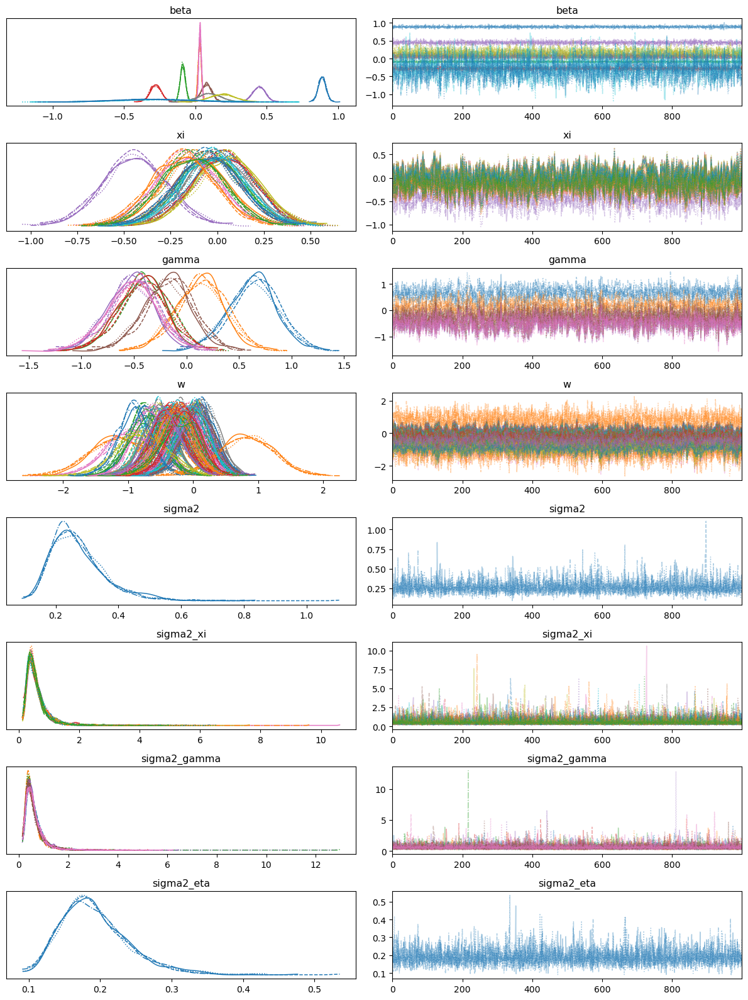

In [80]:
az.plot_trace(post_pred.posterior_az, var_names = ['beta', 'xi', 'gamma', 'w', 'sigma2', 'sigma2_xi', 'sigma2_gamma', 'sigma2_eta'])
plt.tight_layout()
plt.show()

In [81]:
waic_out = az.waic(post_pred.posterior_az, var_name='log_lik')
loo_out = az.loo(post_pred.posterior_az, var_name='log_lik')
waic = waic_out.elpd_waic
loo = loo_out.elpd_loo
print(waic_out)
print(loo_out)

C:\Users\leoma\anaconda3\Lib\site-packages\arviz\stats\stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


Computed from 4000 posterior samples and 2688 observations log-likelihood matrix.

          Estimate       SE
elpd_waic -6709.32   103.83
p_waic      167.80        -

There has been a warning during the calculation. Please check the results.
Computed from 4000 posterior samples and 2688 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -6709.76   103.85
p_loo      168.24        -
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.5]   (good)     2688  100.0%
 (0.5, 0.7]   (ok)          0    0.0%
   (0.7, 1]   (bad)         0    0.0%
   (1, Inf)   (very bad)    0    0.0%



In [82]:
alpha = 0.05
y_pred, metrics = post_pred.predict(CI=True,
                                       alpha = alpha,
                                       error_metrics = True)

In [83]:
y_obs, residuals, mse, mae, mad, mse_test, mae_test, mad_test, outliers_test, percentage_inside_CI_test, outliers, percentage_inside = metrics.values()
print(f'The total number of outliers is: {len(outliers)}\n')
print(f'The total number of outliers in the test set is: {len(outliers_test)}\n')
print(f'The MSE is: {mse}\n')
print(f'The MAE is: {mae}\n')
print(f'The MAD is: {mad}\n')
print(f'The MSE in the test set is: {mse_test}\n')
print(f'The MAE in the test set is: {mae_test}\n')
print(f'The MAD in the test set is: {mad_test}\n')
print(f'The percentage of observations inside the CI is: {percentage_inside}\n')
print(f'The percentage of observations inside the CI of the test is: {percentage_inside_CI_test}\n')

The total number of outliers is: 478

The total number of outliers in the test set is: 158

The MSE is: 10.474869791666666

The MAE is: 2.316666666666667

The MAD is: 2.0

The MSE in the test set is: 10.955078125

The MAE in the test set is: 2.39453125

The MAD in the test set is: 2.0

The percentage of observations inside the CI is: 0.8755208333333333

The percentage of observations inside the CI of the test is: 0.8628472222222222



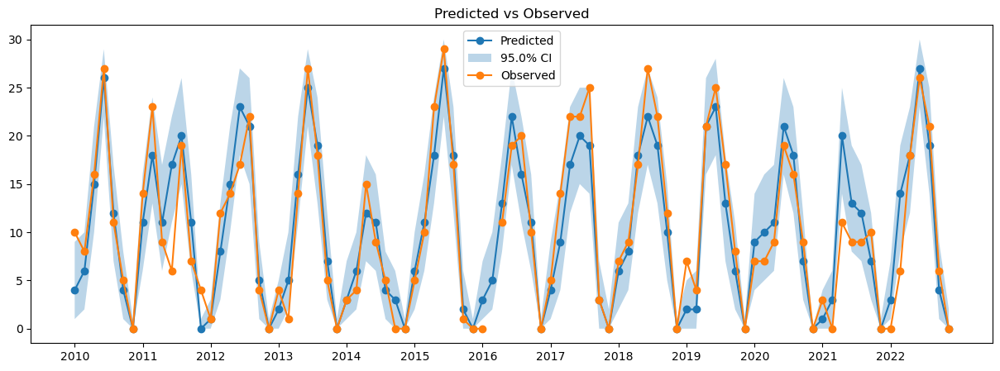

In [84]:
station_num_to_plot = 35 # Change this to plot a different station, -1 to plot manually
if station_num_to_plot != -1:
    xx = np.arange(13*7*(station_num_to_plot-1), 13*7*station_num_to_plot)
else:
    xx = np.arange(1000, 1200) # Change this for the range of the manual choice
plt.figure(figsize=(15, 5))
plt.plot(xx, y_pred.loc[xx, 'pred'], label='Predicted', linestyle='-', marker='o')
plt.fill_between(xx, y_pred.loc[xx, f'{alpha/2}'], y_pred.loc[xx, f'{(1-alpha/2)}'], alpha=0.3, label=f'{(1-alpha)*100}% CI')
plt.plot(xx, Y_data[xx], label='Observed', linestyle='-', marker='o')
plt.xticks(xx[np.arange(0,len(xx),7)], np.arange(2010,2023))
plt.legend()
plt.title('Predicted vs Observed')
plt.show()

In [85]:
Models_120_df.loc['probit var', :] = [waic, loo, mse, mae, mad, percentage_inside, mse_test, mae_test, mad_test, percentage_inside_CI_test]
print(Models_120_df)

                   WAIC          LOO        MSE       MAE  MAD inside CI  \
logit      -6671.889569 -6672.255815  10.338086  2.293099  2.0  0.878906   
probit     -6707.434133 -6707.783995  10.450716  2.316536  2.0  0.873437   
logit var  -6672.548816 -6672.936713  10.280469   2.28724  2.0  0.879167   
probit var -6709.324349 -6709.760168   10.47487  2.316667  2.0  0.875521   

             MSE test  MAE test MAD test inside CI test  
logit       10.818793   2.37717      2.0       0.863715  
probit      11.016493  2.405382      2.0       0.861979  
logit var   10.768229   2.37066      2.0       0.863715  
probit var  10.955078  2.394531      2.0       0.862847  


Provo a mettere random il range dello spatial model

In [86]:
bin_probit_var_rho = FetchModel('bin_probit_var_rho').compile()

21:23:42 - cmdstanpy - INFO - compiling stan file C:\Users\leoma\OneDrive\DOCUME~1\PoliMi\AAB4F7~1.23-\BAYESI~1\BAYESI~1\main\Modello\stan\bin_probit_var_rho.stan to exe file C:\Users\leoma\OneDrive\Documents\PoliMi\A.A. 23-24\Bayesian statistics\Bayesian_Project\main\Modello\stan\bin_probit_var_rho.exe
21:24:35 - cmdstanpy - INFO - compiled model executable: C:\Users\leoma\OneDrive\Documents\PoliMi\A.A. 23-24\Bayesian statistics\Bayesian_Project\main\Modello\stan\bin_probit_var_rho.exe


In [87]:
bin_probit_var_rho = bin_probit_var_rho.sample(data=data_120, chains=4, parallel_chains=4, 
    iter_warmup=1000, iter_sampling=1000)
posterior_bin_probit_var_rho = az.from_cmdstanpy(bin_probit_var_rho)

21:24:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:35:42 - cmdstanpy - INFO - CmdStan done processing.
21:35:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: cholesky_decompose: Matrix m is not positive definite (in 'bin_probit_var_rho.stan', line 54, column 2 to column 63)
Consider re-running with show_console=True if the above output is unclear!


In [88]:
post_pred = PostPred(posterior_bin_probit_var_rho, Y['Count_120'], test_train=True, idx_test=idx_test)
Y_data = post_pred.Y
post_pred.posterior_az

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats

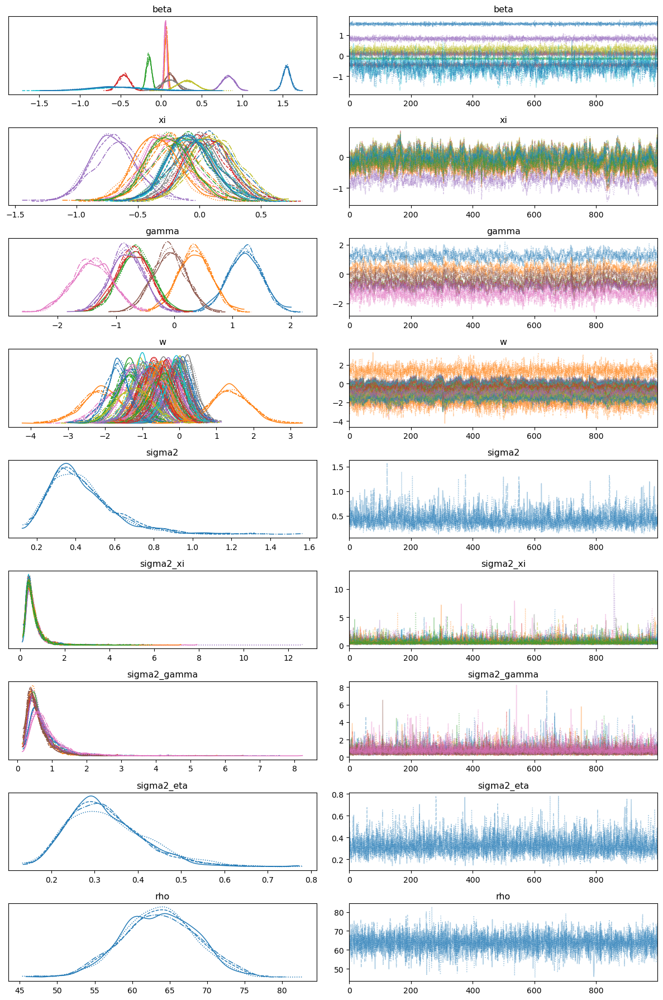

In [89]:
az.plot_trace(post_pred.posterior_az, var_names = ['beta', 'xi', 'gamma', 'w', 'sigma2', 'sigma2_xi', 'sigma2_gamma', 'sigma2_eta', 'rho'])
plt.tight_layout()
plt.show()

In [90]:
waic_out = az.waic(post_pred.posterior_az, var_name='log_lik')
loo_out = az.loo(post_pred.posterior_az, var_name='log_lik')
waic = waic_out.elpd_waic
loo = loo_out.elpd_loo
print(waic_out)
print(loo_out)

C:\Users\leoma\anaconda3\Lib\site-packages\arviz\stats\stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


Computed from 4000 posterior samples and 2688 observations log-likelihood matrix.

          Estimate       SE
elpd_waic -6671.79   101.73
p_waic      161.69        -

There has been a warning during the calculation. Please check the results.
Computed from 4000 posterior samples and 2688 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -6672.12   101.73
p_loo      162.02        -
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.5]   (good)     2688  100.0%
 (0.5, 0.7]   (ok)          0    0.0%
   (0.7, 1]   (bad)         0    0.0%
   (1, Inf)   (very bad)    0    0.0%



In [91]:
alpha = 0.05
y_pred, metrics = post_pred.predict(CI=True,
                                       alpha = alpha,
                                       error_metrics = True)

In [92]:
y_obs, residuals, mse, mae, mad, mse_test, mae_test, mad_test, outliers_test, percentage_inside_CI_test, outliers, percentage_inside = metrics.values()
print(f'The total number of outliers is: {len(outliers)}\n')
print(f'The total number of outliers in the test set is: {len(outliers_test)}\n')
print(f'The MSE is: {mse}\n')
print(f'The MAE is: {mae}\n')
print(f'The MAD is: {mad}\n')
print(f'The MSE in the test set is: {mse_test}\n')
print(f'The MAE in the test set is: {mae_test}\n')
print(f'The MAD in the test set is: {mad_test}\n')
print(f'The percentage of observations inside the CI is: {percentage_inside}\n')
print(f'The percentage of observations inside the CI of the test is: {percentage_inside_CI_test}\n')

The total number of outliers is: 463

The total number of outliers in the test set is: 156

The MSE is: 10.309375

The MAE is: 2.29140625

The MAD is: 2.0

The MSE in the test set is: 10.786675347222221

The MAE in the test set is: 2.380642361111111

The MAD in the test set is: 2.0

The percentage of observations inside the CI is: 0.8794270833333333

The percentage of observations inside the CI of the test is: 0.8645833333333334



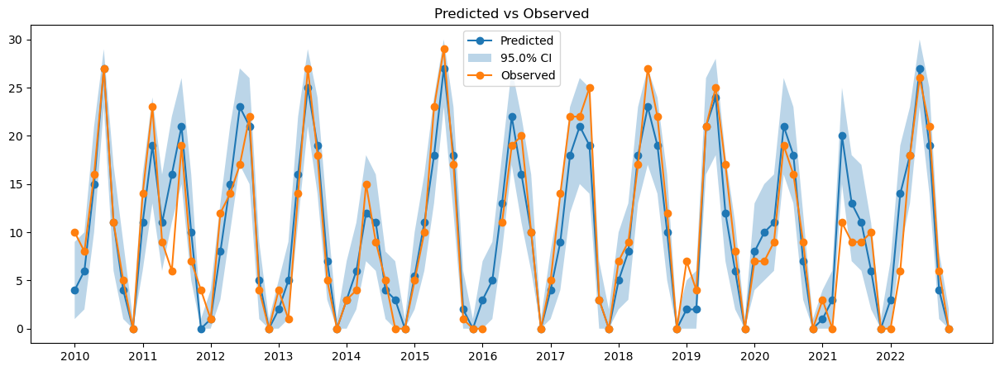

In [93]:
station_num_to_plot = 35 # Change this to plot a different station, -1 to plot manually
if station_num_to_plot != -1:
    xx = np.arange(13*7*(station_num_to_plot-1), 13*7*station_num_to_plot)
else:
    xx = np.arange(1000, 1200) # Change this for the range of the manual choice
plt.figure(figsize=(15, 5))
plt.plot(xx, y_pred.loc[xx, 'pred'], label='Predicted', linestyle='-', marker='o')
plt.fill_between(xx, y_pred.loc[xx, f'{alpha/2}'], y_pred.loc[xx, f'{(1-alpha/2)}'], alpha=0.3, label=f'{(1-alpha)*100}% CI')
plt.plot(xx, Y_data[xx], label='Observed', linestyle='-', marker='o')
plt.xticks(xx[np.arange(0,len(xx),7)], np.arange(2010,2023))
plt.legend()
plt.title('Predicted vs Observed')
plt.show()

In [94]:
Models_120_df.loc['probit var rho', :] = [waic, loo, mse, mae, mad, percentage_inside, mse_test, mae_test, mad_test, percentage_inside_CI_test]
print(Models_120_df)

                       WAIC          LOO        MSE       MAE  MAD inside CI  \
logit          -6671.889569 -6672.255815  10.338086  2.293099  2.0  0.878906   
probit         -6707.434133 -6707.783995  10.450716  2.316536  2.0  0.873437   
logit var      -6672.548816 -6672.936713  10.280469   2.28724  2.0  0.879167   
probit var     -6709.324349 -6709.760168   10.47487  2.316667  2.0  0.875521   
probit var rho -6671.793575 -6672.120611  10.309375  2.291406  2.0  0.879427   

                 MSE test  MAE test MAD test inside CI test  
logit           10.818793   2.37717      2.0       0.863715  
probit          11.016493  2.405382      2.0       0.861979  
logit var       10.768229   2.37066      2.0       0.863715  
probit var      10.955078  2.394531      2.0       0.862847  
probit var rho  10.786675  2.380642      2.0       0.864583  
